# Chapter 01 - Applying Geometric Transformations to Images

## PyEmotion : Moment 2회차
## OpenCV
## YKLEE

- Book : OpenCV 3.x with Python by Example
- github: https://github.com/PacktPublishing/OpenCV-3-x-with-Python-By-Example
2018/11/06 

### Part 2
  5. Image Merge 
  6. Image translation
  7. Image rotation
  8. Image scaling
  9. Affine transformations
  10. Projective transformations
  11. Image warping - 생략


# 0. Setup_사전 작업

In [29]:
import numpy as np

import cv2

# 0. How to run your python code in Jupyter notebook_노트북 환경에서 파이썬 실행

``` python
!python name-of-the-file.py
```

# 5. Merging image channels

We can read an image, split it into separate channels, and **merge** them to see how different effects can be obtained out of different combinations

run the code below or run the author's "05_image_color_merge.py" file to check the effect. 

```python
img = cv2.imread('./images/input.jpg',cv2.IMREAD_COLOR)
g,b,r = cv2.split(img)
gbr_img = cv2.merge((g,b,r))
rbr_img = cv2.merge((r,b,r))
cv2.imshow('Original', img)
cv2.imshow('GRB', gbr_img)
cv2.imshow('RBR', rbr_img)
cv2.waitKey()
```

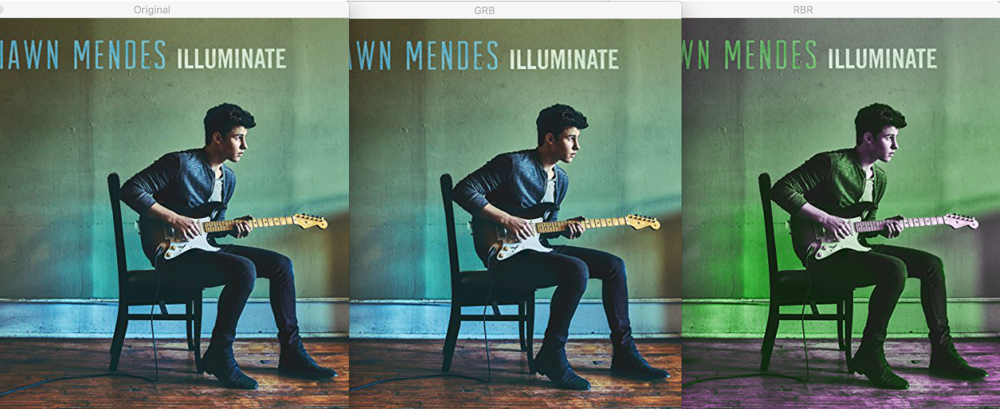

# 6. Image translation


Let's **shift** an image. Let's move the image within our frame of reference. In computer vision terminology, this is referred to as **translation**. 


## Translation 

shifting the image by adding/subtracting the x and y coordinates. In order to do this, we need to create a transformation matrix like the one below:

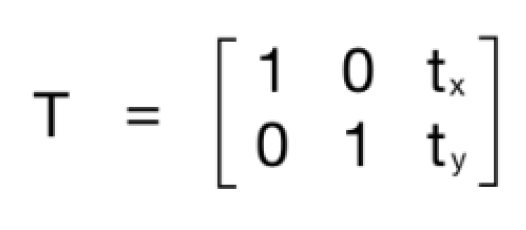

tx and ty values = x and y translation values
= image will be moved by x units to the right, and by y units downwards. 


run the code below, or run the python code "06_image_translation.py" from the author.

``` python

import cv2
import numpy as np
img = cv2.imread('images/input.jpg')
num_rows, num_cols = img.shape[:2]
translation_matrix = np.float32([ [1,0,70], [0,1,110] ])
img_translation = cv2.warpAffine(img, translation_matrix, (num_cols,
num_rows), cv2.INTER_LINEAR)
cv2.imshow('Translation', img_translation)
cv2.waitKey()

```

### _warpAffine_

We use _warpAffine_ function to create a matrix like above. 

_warpAffine_
("num_cols + a, num_rows + b) refers to the number of rows and columns in the resulting image.

1. In order to shift the target image, add more cols and rows to the image like below: 

```python
img_translation = cv2.warpAffine(img, translation_matrix,
(num_cols + 70, num_rows + 110))
```

2. In order to avoid the cropping add more cols and rows to the frame like below : 

```python
translation_matrix = np.float32([ [1,0,-40], [0,1,-30] ])
img_translation = cv2.warpAffine(img_translation, translation_matrix, (num_cols + 70 + 30, num_rows + 110 + 50))
```

06_translation_output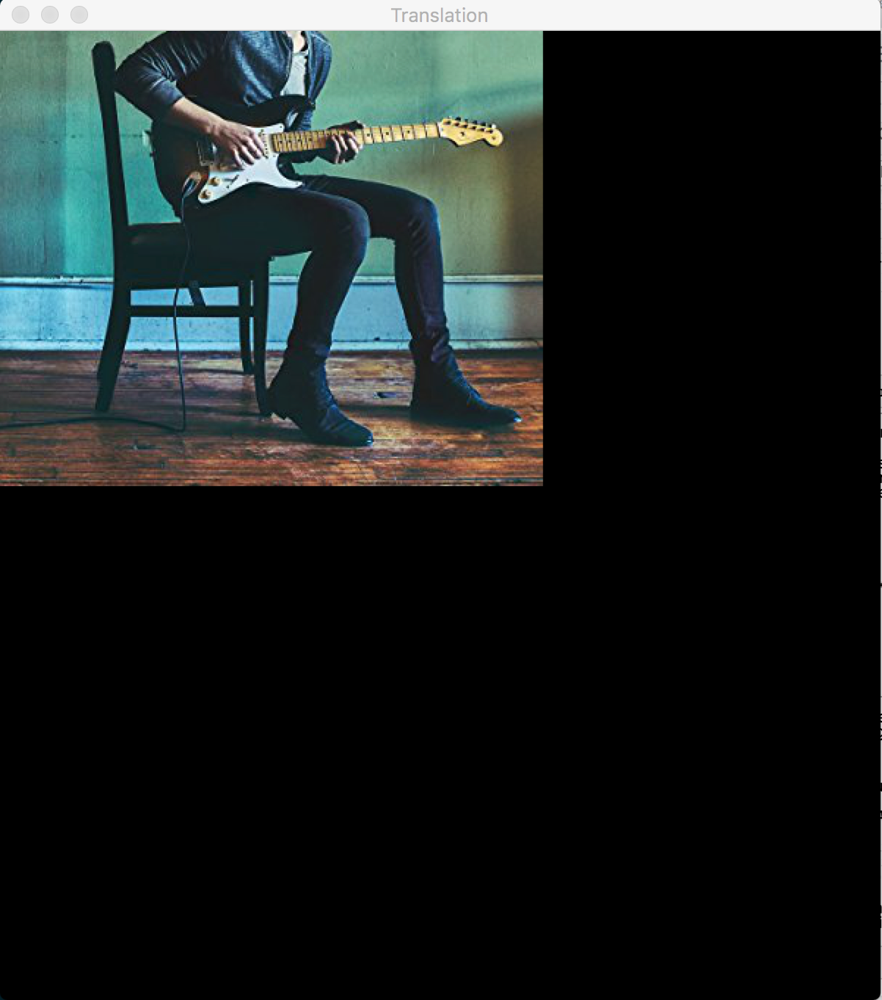

## extra practice 1 (p22)

1. If you want to move the image to the middle of a bigger image frame

```python

import cv2
import numpy as np
img = cv2.imread('images/input.jpg')
num_rows, num_cols = img.shape[:2]
translation_matrix = np.float32([ [1,0,70], [0,1,110] ])
img_translation = cv2.warpAffine(img, translation_matrix, (num_cols + 70,
num_rows + 110))
translation_matrix = np.float32([ [1,0,-30], [0,1,-50] ])
img_translation = cv2.warpAffine(img_translation, translation_matrix,
(num_cols + 70 + 30, num_rows + 110 + 50))
cv2.imshow('Translation', img_translation)
cv2.waitKey()

```


## extra practice 2 (p23)

Filling up the empty borders of the translation with a pixel extrapolation method: 

 _borderMode_  and _borderValue_ function


```python

import cv2
import numpy as np
img = cv2.imread('./images/input.jpg')
num_rows, num_cols = img.shape[:2]
translation_matrix = np.float32([ [1,0,70], [0,1,110] ])
img_translation = cv2.warpAffine(img, translation_matrix, (num_cols,
num_rows), cv2.INTER_LINEAR, cv2.BORDER_WRAP, 1)
cv2.imshow('Translation', img_translation)
cv2.waitKey()

```


# 7. Image Rotation

Let's **rotate** a given image by a certain angle. 


## _getRotationMatrix2D_


- set a center point, then the angle of rotation in degrees, a scaling for the image at the end. 

- We can achieve rotation (which is also a form of transformation) by following transformation matrix

* theta = angle of rotation in the counterclockwise direction 
* Once we have the transformation matrix, we can use the warpAffine function to apply this matrix to any image

07_rotation_matrix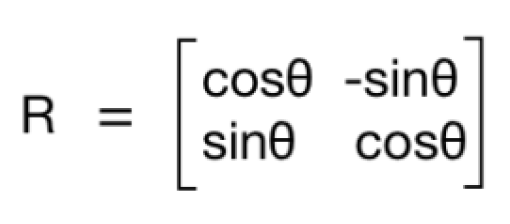

run the code below.

```python

import cv2
import numpy as np
img = cv2.imread('images/input.jpg')num_rows, num_cols = img.shape[:2]
rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30,
0.7)
img_rotation = cv2.warpAffine(img, rotation_matrix, (num_cols, num_rows))
cv2.imshow('Rotation', img_rotation)
cv2.waitKey()

```

07_rotation_1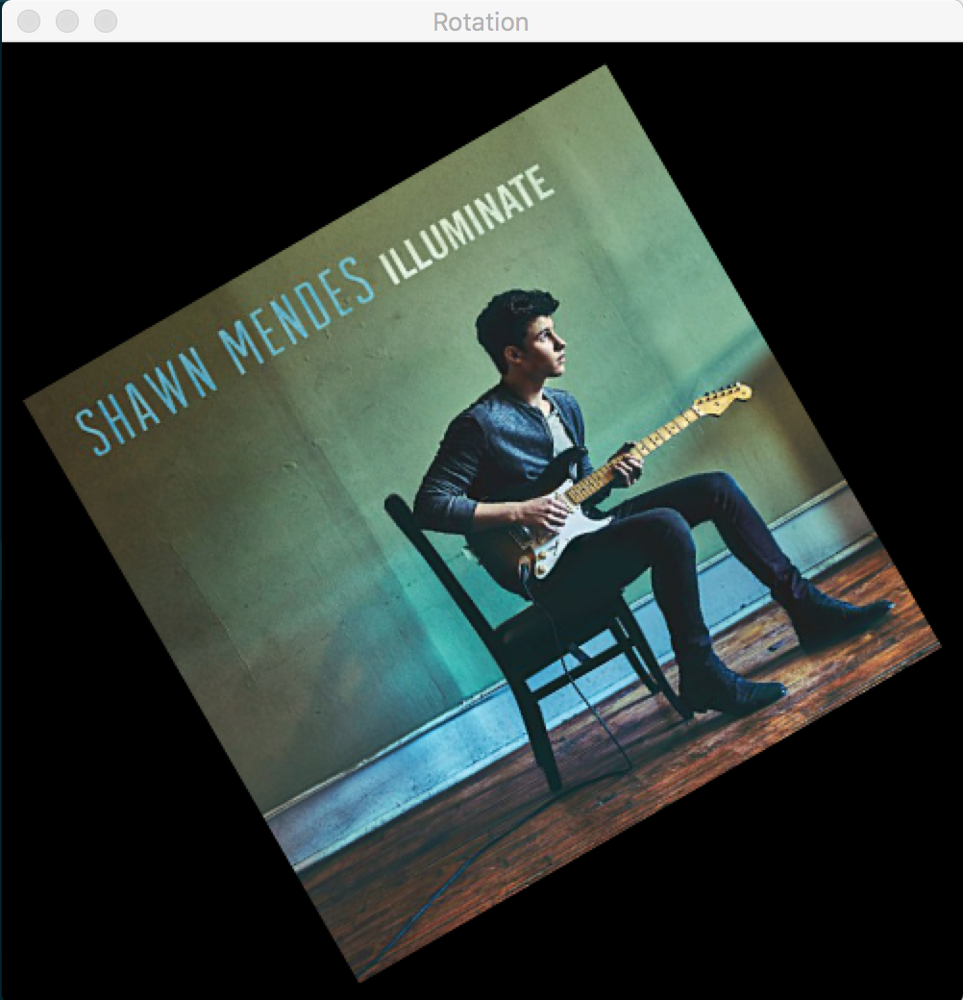

#### extra practice
Check out the rotated image with **enough spaces** given by running the python code "07_image_rotation.py" from the author.

#### extra practice - rotation output 1

img_rotation = cv2.warpAffine(img_translation, rotation_matrix, (num_cols*1, num_rows*1))

07_translation_output_1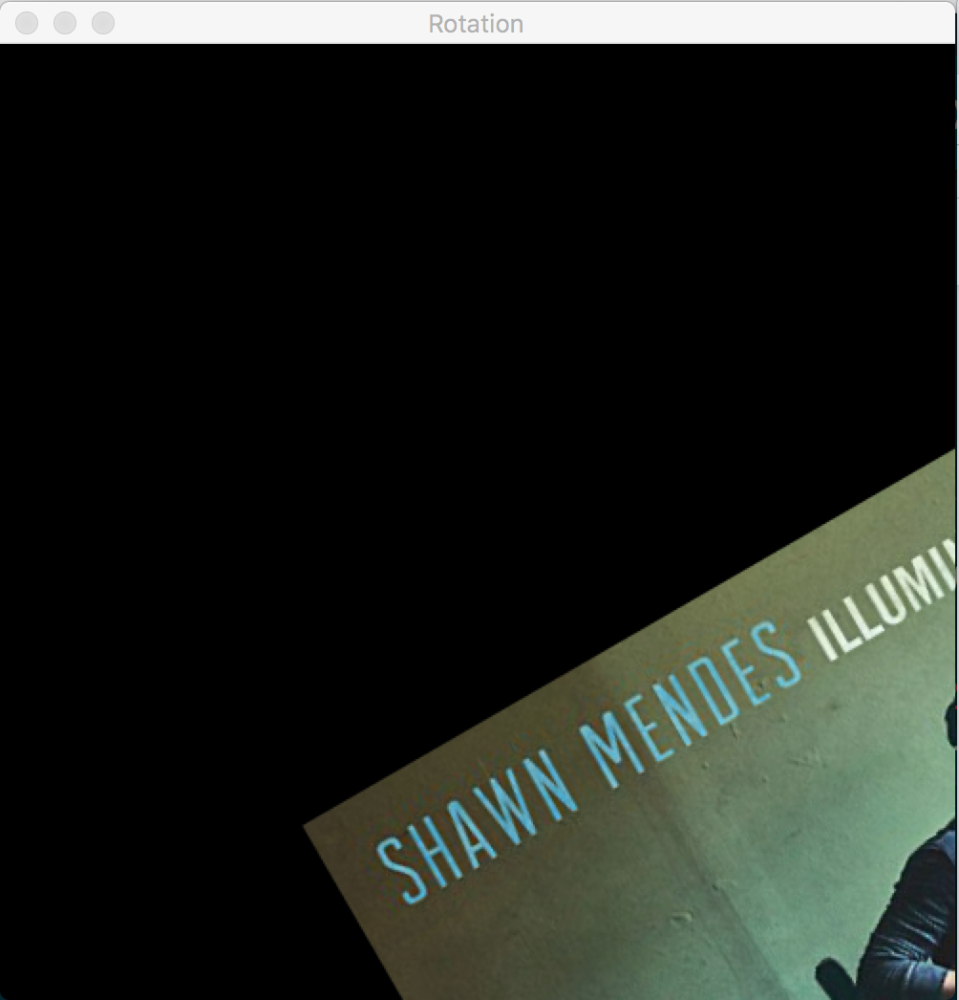

#### extra practice - rotation output 2

rotation_matrix = cv2.getRotationMatrix2D((num_cols, num_rows), 10, 1)

07_translation_output_2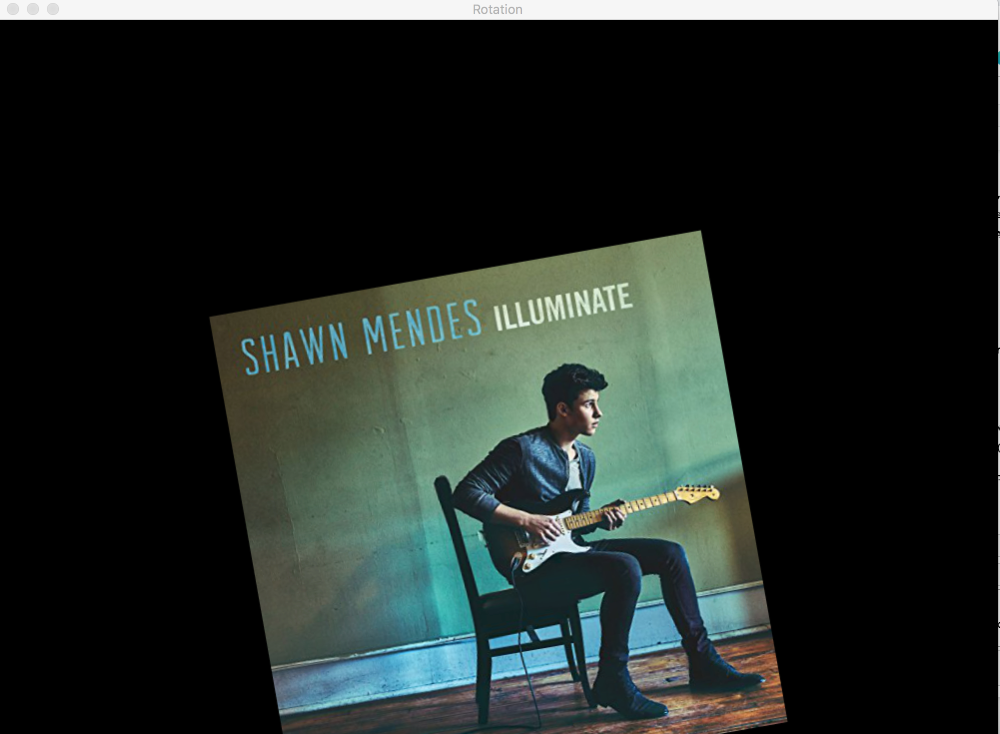

# 8. Image Scaling

Lets **resize** an image! 

##  Image Scaling: 

https://en.wikipedia.org/wiki/Image_scaling

- when resizing an image, there are multiple ways to **fill** in the pixel values


- When **enlarging an image,** we need to fill up the pixel values in between pixel locations 
    - linear or cubic interpolaton preferred. 
    - cubic interpolation = computationally more complex & slower than linear interpolation, but quality of resulting image will be higher 


- when **shrinking an image,** we need to take the best representative value.
    - area-based interpolation 


- When scaling by a non-integer value, we need to interpolate values appropriately, so that the quality of the image is maintained. 


## - 보간법 활용 예
http://blog.naver.com/PostView.nhn?blogId=dic1224&logNo=220841171866

run the code below or run the author's "08_image_scaling.py" file. 

```python

import cv2

img = cv2.imread('images/input.jpg')

img_scaled = cv2.resize(img,None,fx=1.2, fy=1.2, interpolation = cv2.INTER_LINEAR)
cv2.imshow('Scaling - Linear Interpolation', img_scaled)

img_scaled = cv2.resize(img,None,fx=1.2, fy=1.2, interpolation = cv2.INTER_CUBIC)
cv2.imshow('Scaling - Cubic Interpolation', img_scaled)

img_scaled = cv2.resize(img,(450, 400), interpolation = cv2.INTER_AREA)
cv2.imshow('Scaling - Skewed Size', img_scaled)

cv2.waitKey()
```

08_resize_output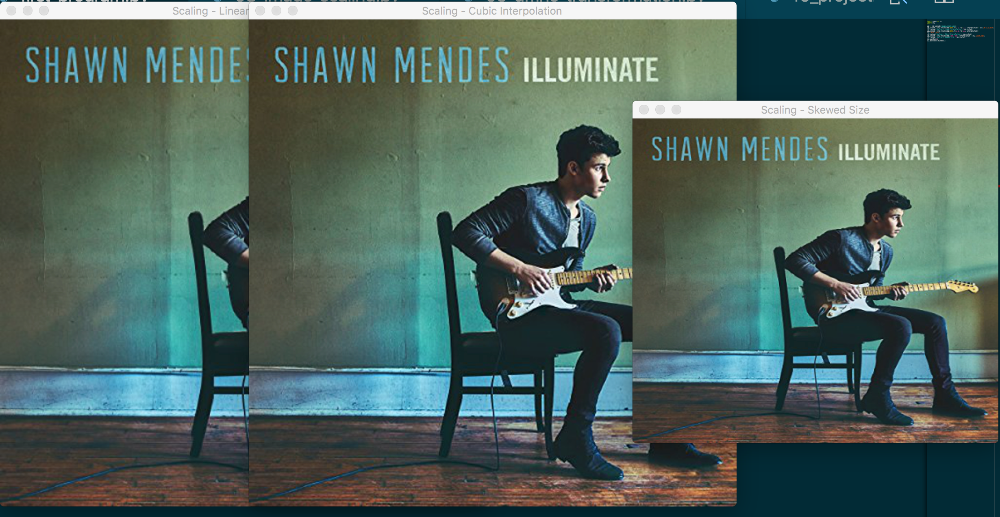

-------

# 9 & 10. Affine transformation/Projective transformation

affine transformation : a method to preserve length and angle measures of an image with euclidean transformation. 
(take an geometric shape + Euclidean transformation)

it might look rotated, shifted, or so on but the basic structure remains intact. 

# Types of Geometric transformations

transformation_apple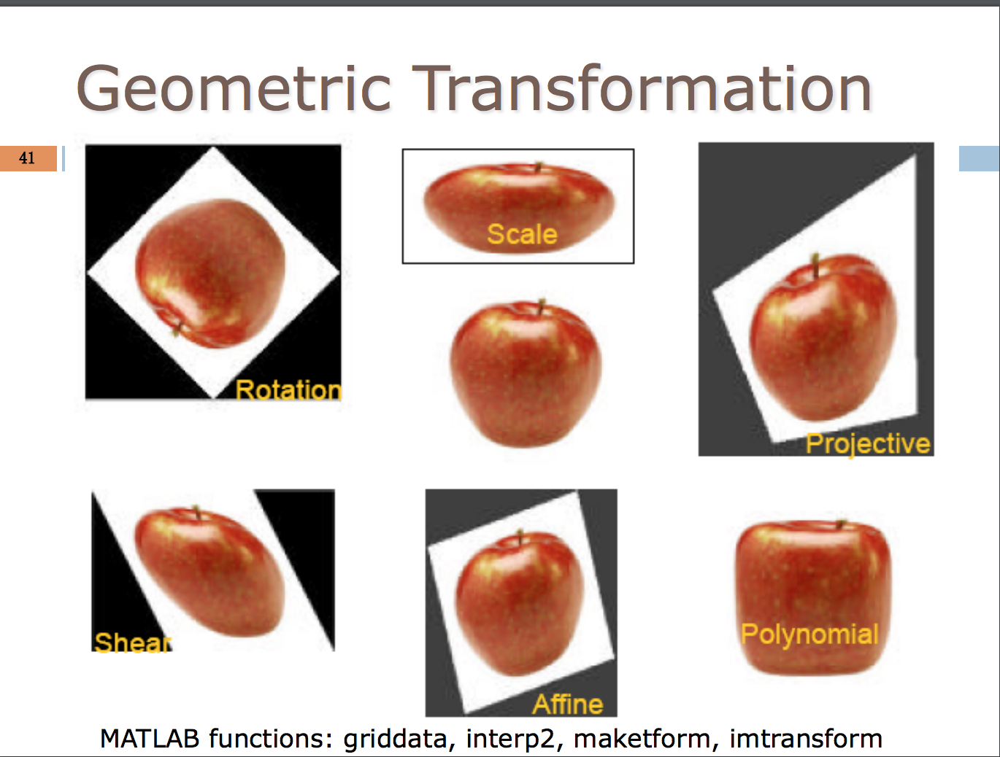
source: http://www.di.univr.it/documenti/OccorrenzaIns/matdid/matdid358544.pdf

(textbook - p28)

## 8. affine : 

run the code below or run the author's "09_affine_transformation.py" code. 

```python
import cv2
import numpy as np
img = cv2.imread('images/input.jpg')
rows, cols = img.shape[:2]
src_points = np.float32([[0,0], [cols-1,0], [0,rows-1]])
dst_points = np.float32([[0,0], [int(0.6*(cols-1)),0],
[int(0.4*(cols-1)),rows-1]])
affine_matrix = cv2.getAffineTransform(src_points, dst_points)
img_output = cv2.warpAffine(img, affine_matrix, (cols,rows))
cv2.imshow('Input', img)
cv2.imshow('Output', img_output)
cv2.waitKey()
```

## 9. projective: 

run the code below or run the author's "10_projective_transformation.py" code. 

```python
import cv2
import numpy as np

img = cv2.imread('images/input.jpg')
rows, cols = img.shape[:2]

src_points = np.float32([[0,0], [cols-1,0], [0,rows-1], [cols-1,rows-1]])
dst_points = np.float32([[0,0], [cols-1,0], [int(0.33*cols),rows-1], [int(0.66*cols),rows-1]])

projective_matrix = cv2.getPerspectiveTransform(src_points, dst_points)
img_output = cv2.warpPerspective(img, projective_matrix, (cols,rows))

cv2.imshow('Input', img)
cv2.imshow('Output', img_output)

cv2.waitKey()

```

### 참고) 

- Transformation: 
https://opencv-python.readthedocs.io/en/latest/doc/10.imageTransformation/imageTransformation.html



- transformation 도식으로 한 눈에 보기:  
https://blog.naver.com/jang_hwan_im/221289668071



- Affine transformation: 
https://www.mathworks.com/discovery/affine-transformation.html



    - e.g., https://webnautes.tistory.com/1252



- Projective transformation: 
http://en.wikipedia.org/wiki/Incidence_(geometry)
http://en.wikipedia.org/wiki/Cross-ratio.